#Proyecto 2: Sparkify y Spark SQL

Fecha: Noviembre 8 de 2021

Integrantes:
* David Gutierrez Alarcon
* Enrique Gutierrez Ibague
* Jose Carlos Molano de Oro
* Juan Sebastian Vargas Torres
* Julian David Tarazona Torres

#Imports necesarios

In [0]:
from pyspark.sql.types import *
from pyspark.sql.types import *
from pyspark.sql.functions import lit
from pyspark.ml import Pipeline
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.feature import StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StandardScaler
from pyspark.ml.feature import MinMaxScaler

import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
import numpy as np

#Preparación de los datos

##Exploración de los datos

In [0]:
#s3n://udacity-dsnd/sparkify/sparkify_event_data.json
#/FileStore/tables/medium_sparkify_event_data.json
data = "/FileStore/tables/medium_sparkify_event_data.json"
df = spark.read.json(data)

In [0]:
display(df)

artist,auth,firstName,gender,itemInSession,lastName,length,level,location,method,page,registration,sessionId,song,status,ts,userAgent,userId
Martin Orford,Logged In,Joseph,M,20,Morales,597.55057,free,"Corpus Christi, TX",PUT,NextSong,1532063507000,292,Grand Designs,200,1538352011000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.125 Safari/537.36""",293
John Brown's Body,Logged In,Sawyer,M,74,Larson,380.21179,free,"Houston-The Woodlands-Sugar Land, TX",PUT,NextSong,1538069638000,97,Bulls,200,1538352025000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",98
Afroman,Logged In,Maverick,M,184,Santiago,202.37016,paid,"Orlando-Kissimmee-Sanford, FL",PUT,NextSong,1535953455000,178,Because I Got High,200,1538352118000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",179
null,Logged In,Maverick,M,185,Santiago,null,paid,"Orlando-Kissimmee-Sanford, FL",PUT,Logout,1535953455000,178,null,307,1538352119000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",179
Lily Allen,Logged In,Gianna,F,22,Campos,194.53342,paid,"Mobile, AL",PUT,NextSong,1535931018000,245,Smile (Radio Edit),200,1538352124000,Mozilla/5.0 (Windows NT 6.1; WOW64; rv:31.0) Gecko/20100101 Firefox/31.0,246
Carter USM,Logged In,Sofia,F,266,Gordon,138.29179,paid,"Rochester, MN",PUT,NextSong,1533175710000,162,Airplane Food,200,1538352125000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/37.0.2062.94 Safari/537.36""",163
null,Logged Out,null,null,186,null,null,paid,null,GET,Home,null,178,null,200,1538352148000,null,
null,Logged Out,null,null,187,null,null,paid,null,GET,Home,null,178,null,200,1538352151000,null,
null,Logged Out,null,null,188,null,null,paid,null,GET,Home,null,178,null,200,1538352168000,null,
null,Logged Out,null,null,189,null,null,paid,null,PUT,Login,null,178,null,307,1538352169000,null,


###Schema

In [0]:
df.printSchema()

root
 |-- artist: string (nullable = true)
 |-- auth: string (nullable = true)
 |-- firstName: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- itemInSession: long (nullable = true)
 |-- lastName: string (nullable = true)
 |-- length: double (nullable = true)
 |-- level: string (nullable = true)
 |-- location: string (nullable = true)
 |-- method: string (nullable = true)
 |-- page: string (nullable = true)
 |-- registration: long (nullable = true)
 |-- sessionId: long (nullable = true)
 |-- song: string (nullable = true)
 |-- status: long (nullable = true)
 |-- ts: long (nullable = true)
 |-- userAgent: string (nullable = true)
 |-- userId: string (nullable = true)



###Variables numéricas
| Variable | Descripción |
| :-----: | :-: |
| ItemInSession | Número de acciones que se realizaron durante una sesión |
| Length | Tiempo en segundos de cada canción |
| Registration | Timestamp del momento en que se registró un usuario |
| SessionId | Un id único que se asigna a la visita de un usuario al sistema |
| Status | HTTP status code |
| Ts | Timestamp del evento o acción |

####Resumen ItemInSession

In [0]:
display(df.select("*").groupBy("itemInSession").count().orderBy("count",ascending=False))

itemInSession,count
0,6276
1,6012
2,5920
3,5823
4,5739
5,5679
6,5590
7,5487
8,5421
9,5327


In [0]:
df.describe(['itemInSession']).show()

+-------+------------------+
|summary|     itemInSession|
+-------+------------------+
|  count|            543705|
|   mean|107.30629109535502|
| stddev|116.72350849188166|
|    min|                 0|
|    max|              1005|
+-------+------------------+



####Resumen Length

In [0]:
display(df.select("*").groupBy("length").count().orderBy("count",ascending=False))

length,count
null,110828
239.3073,2320
348.57751,1962
201.79546,1735
655.77751,1343
277.15873,1239
219.66322,1069
224.67873,1049
220.89098,1023
252.21179,896


In [0]:
df.describe(['length']).show()

+-------+-----------------+
|summary|           length|
+-------+-----------------+
|  count|           432877|
|   mean|248.6645927800741|
| stddev|98.41266955052022|
|    min|          0.78322|
|    max|       3024.66567|
+-------+-----------------+



####Resumen Registration

In [0]:
display(df.select("*").groupBy("registration").count().orderBy("count",ascending=False))

registration,count
null,15700
1536403972000,9767
1536642109000,7448
1537523064000,7309
1535066380000,6842
1538178448000,6810
1536082261000,6184
1527341164000,6019
1533175710000,5965
1536859413000,5678


####Resumen SessionId

In [0]:
display(df.select("*").groupBy("sessionId").count().orderBy("count",ascending=False))

sessionId,count
1052,1006
2860,926
3425,899
4131,885
477,837
2470,816
836,788
3513,778
3821,754
356,748


####Resumen Status

In [0]:
display(df.select("*").groupBy("status").count().orderBy("count",ascending=False))

status,count
200,493269
307,49917
404,519


####Resumen Ts

In [0]:
display(df.select("*").groupBy("ts").count().orderBy("count",ascending=False))

ts,count
1540578051000,4
1540243306000,4
1541586146000,4
1541170510000,4
1540953027000,4
1540505832000,4
1540977702000,4
1539784236000,4
1540501085000,4
1542052928000,4


###Variables no numéricas
| Variable | Descripción |
| :-----: | :-: |
| Artist | Artista de la canción reproducida |
| Auth | Tipo de autenticación |
| FirstName | Primer nombre del usuario |
| Gender | Género del usuario |
| LastName | Apellido del usuario |
| Level | Tipo de suscripción |
| Location | Ubicación del usuario |
| Method | HTTP request method |
| Page | Tipo de evento o acción (Página vistada por el usuario) |
| Song | Nombre de la canción reproducida |
| UserAgent | Dispositivo utilizado por el usuario (Browser +OS) |
| UserId | Id único del usuario |

####Resumen artist

In [0]:
display(df.select("*").groupBy("artist").count().orderBy("count",ascending=False))

artist,count
null,110828
Kings Of Leon,3497
Coldplay,3439
Florence + The Machine,2314
Muse,2194
Dwight Yoakam,2187
The Black Keys,2160
BjÃÂ¶rk,2150
Justin Bieber,2096
Jack Johnson,2049


####Resumen auth

In [0]:
display(df.select("*").groupBy("auth").count().orderBy("count",ascending=False))

auth,count
Logged In,527906
Logged Out,15606
Cancelled,99
Guest,94


####Resumen firstName

In [0]:
display(df.select("*").groupBy("firstName").count().orderBy("count",ascending=False))

firstName,count
null,15700
Joseph,13108
Riley,10426
Sophia,9245
Colin,8736
Daniel,7476
Lucero,7448
Alex,7400
Janiyah,6810
Sofia,6629


####Resumen gender

In [0]:
display(df.select("*").groupBy("gender").count().orderBy("count",ascending=False))

gender,count
M,302612
F,225393
null,15700


####Resumen lastName

In [0]:
display(df.select("*").groupBy("lastName").count().orderBy("count",ascending=False))

lastName,count
null,15700
Reed,12767
Taylor,12666
Stewart,11720
Robinson,11291
Johnson,11170
Williams,10291
Jones,10075
White,9287
Cook,8665


####Resumen level

In [0]:
display(df.select("*").groupBy("level").count().orderBy("count",ascending=False))

level,count
paid,428597
free,115108


####Resumen location

In [0]:
display(df.select("*").groupBy("location").count().orderBy("count",ascending=False))

location,count
"New York-Newark-Jersey City, NY-NJ-PA",40156
"Los Angeles-Long Beach-Anaheim, CA",34278
"Boston-Cambridge-Newton, MA-NH",17574
null,15700
"Chicago-Naperville-Elgin, IL-IN-WI",15194
"San Francisco-Oakland-Hayward, CA",11428
"Atlanta-Sandy Springs-Roswell, GA",11211
"Phoenix-Mesa-Scottsdale, AZ",11184
"Dallas-Fort Worth-Arlington, TX",11061
"Denver-Aurora-Lakewood, CO",9808


####Resumen method

In [0]:
display(df.select("*").groupBy("method").count().orderBy("count",ascending=False))

method,count
PUT,495143
GET,48562


####Resumen page

In [0]:
display(df.select("*").groupBy("page").count().orderBy("count",ascending=False))

page,count
NextSong,432877
Home,27412
Thumbs Up,23826
Add to Playlist,12349
Add Friend,8087
Roll Advert,7773
Login,6011
Logout,5990
Thumbs Down,4911
Downgrade,3811


####Resumen song

In [0]:
display(df.select("*").groupBy("song").count().orderBy("count",ascending=False))

song,count
null,110828
You're The One,2219
Undo,1938
Revelry,1613
Sehr kosmisch,1341
Horn Concerto No. 4 in E flat K495: II. Romance (Andante cantabile),1236
Dog Days Are Over (Radio Edit),1048
Secrets,916
Use Somebody,894
Canada,836


####Resumen userAgent

In [0]:
display(df.select("*").groupBy("userAgent").count().orderBy("count",ascending=False))

userAgent,count
"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.125 Safari/537.36""",46082
Mozilla/5.0 (Windows NT 6.1; WOW64; rv:31.0) Gecko/20100101 Firefox/31.0,39456
"""Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",38551
"""Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.125 Safari/537.36""",31702
"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.77.4 (KHTML, like Gecko) Version/7.0.5 Safari/537.77.4""",31653
"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",24357
"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.78.2 (KHTML, like Gecko) Version/7.0.6 Safari/537.78.2""",18384
"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/37.0.2062.94 Safari/537.36""",17518
Mozilla/5.0 (Macintosh; Intel Mac OS X 10.9; rv:31.0) Gecko/20100101 Firefox/31.0,16137
null,15700


####Resumen userId

In [0]:
display(df.select("*").groupBy("userId").count().orderBy("count",ascending=False))

userId,count
,15700
92,9767
140,7448
300049,7309
101,6842
300035,6810
195,6184
230,6019
163,5965
250,5678


##Limpieza y selección de variables

In [0]:
work_df=df

####Eliminación de duplicados e id's vacíos

In [0]:
work_df=df.dropDuplicates()
work_df=work_df.where("userId!=''")

####Remplazo de campos nulos

Se ramplazan los campos nulos con la media de la columna length

In [0]:
work_df=work_df.fillna(248.66, ['length'])

####Adición de columna con el ChrunStatus

In [0]:
churnRiskFunction=udf(lambda x: 1 if (x == "Cancellation Confirmation" or x == "Submit Downgrade") else 0, IntegerType())

In [0]:
work_df=work_df.withColumn("churnStatus",churnRiskFunction("page"))

In [0]:
##work_df= df.drop("method","status","sessionId","firstName","lastName","auth")
work_df= work_df.drop("sessionId","firstName","lastName","artist","song")
display(work_df)

auth,gender,itemInSession,length,level,location,method,page,registration,status,ts,userAgent,userId,churnStatus
Logged In,F,280,223.84281,paid,"Rochester, MN",PUT,NextSong,1533175710000,200,1538355180000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/37.0.2062.94 Safari/537.36""",163,0
Logged In,F,54,525.16526,paid,"Mobile, AL",PUT,NextSong,1535931018000,200,1538357871000,Mozilla/5.0 (Windows NT 6.1; WOW64; rv:31.0) Gecko/20100101 Firefox/31.0,246,0
Logged In,M,26,248.66,free,"Virginia Beach-Norfolk-Newport News, VA-NC",GET,Roll Advert,1533764798000,200,1538357932000,"""Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.125 Safari/537.36""",196,0
Logged In,M,32,248.66,free,"Virginia Beach-Norfolk-Newport News, VA-NC",PUT,Thumbs Up,1533764798000,307,1538358943000,"""Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.125 Safari/537.36""",196,0
Logged In,M,71,163.81342,free,"Corpus Christi, TX",PUT,NextSong,1532063507000,200,1538361215000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.125 Safari/537.36""",293,0
Logged In,M,8,248.66,free,"San Francisco-Oakland-Hayward, CA",PUT,Add Friend,1536756625000,307,1538366575000,"""Mozilla/5.0 (Windows NT 6.2; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.125 Safari/537.36""",282,0
Logged In,M,29,248.66,free,"Kingsport-Bristol-Bristol, TN-VA",PUT,Add to Playlist,1533102330000,200,1538371108000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.77.4 (KHTML, like Gecko) Version/7.0.5 Safari/537.77.4""",131,0
Logged In,M,4,186.69669,free,"Charlotte-Concord-Gastonia, NC-SC",PUT,NextSong,1537522781000,200,1538353600000,Mozilla/5.0 (compatible; MSIE 9.0; Windows NT 6.1; WOW64; Trident/5.0),147,0
Logged In,F,95,176.1171,free,"Los Angeles-Long Beach-Anaheim, CA",PUT,NextSong,1529027541000,200,1538354150000,"""Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/37.0.2062.103 Safari/537.36""",39,0
Logged In,M,5,208.5873,free,"Miami-Fort Lauderdale-West Palm Beach, FL",PUT,NextSong,1534823030000,200,1538359842000,"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",166,0


In [0]:
work_df.createOrReplaceTempView("sparkifyView")

###Creación de varibles derivadas

####User Agent
Se asigna 0 si los usuarios no han usado un dispositivo y 1 si lo han usado, se crea una tabla usando un pivot

In [0]:
userAgentFunction=udf(lambda x: 1 if (x >0) else 0, IntegerType())

In [0]:
userAgentData=work_df.select("*").groupBy("userId","userAgent").count()
userAgentData=userAgentData.withColumn('relation', userAgentFunction("count"))
userAgentData=userAgentData.select("userId","userAgent","relation")
userAgentData=userAgentData.groupBy("userId").pivot("userAgent").sum("relation")
userAgentData=userAgentData.fillna(0)

In [0]:
test=userAgentData
for i in range(1,len(loColumns)):
  #print(loColumns[i],"\n")
  #cNumber= str(i)
  c="Agent_"+str(i)
  print(c,"\n")
  test=test.withColumnRenamed(userAgentData.columns[i],c)
test=test.withColumnRenamed("Mozilla/5.0 (compatible; MSIE 9.0; Windows NT 6.1; WOW64; Trident/5.0)","Agent_71")

Agent_1 

Agent_2 

Agent_3 

Agent_4 

Agent_5 

Agent_6 

Agent_7 

Agent_8 

Agent_9 

Agent_10 

Agent_11 

Agent_12 

Agent_13 

Agent_14 

Agent_15 

Agent_16 

Agent_17 

Agent_18 

Agent_19 

Agent_20 

Agent_21 

Agent_22 

Agent_23 

Agent_24 

Agent_25 

Agent_26 

Agent_27 

Agent_28 

Agent_29 

Agent_30 

Agent_31 

Agent_32 

Agent_33 

Agent_34 

Agent_35 

Agent_36 

Agent_37 

Agent_38 

Agent_39 

Agent_40 

Agent_41 

Agent_42 

Agent_43 

Agent_44 

Agent_45 

Agent_46 

Agent_47 

Agent_48 

Agent_49 

Agent_50 

Agent_51 

Agent_52 

Agent_53 

Agent_54 

Agent_55 

Agent_56 

Agent_57 

Agent_58 

Agent_59 

Agent_60 

Agent_61 

Agent_62 

Agent_63 

Agent_64 

Agent_65 

Agent_66 

Agent_67 

Agent_68 

Agent_69 

Agent_70 



In [0]:
display(test)

userId,Agent_1,Agent_2,Agent_3,Agent_4,Agent_5,Agent_6,Agent_7,Agent_8,Agent_9,Agent_10,Agent_11,Agent_12,Agent_13,Agent_14,Agent_15,Agent_16,Agent_17,Agent_18,Agent_19,Agent_20,Agent_21,Agent_22,Agent_23,Agent_24,Agent_25,Agent_26,Agent_27,Agent_28,Agent_29,Agent_30,Agent_31,Agent_32,Agent_33,Agent_34,Agent_35,Agent_36,Agent_37,Agent_38,Agent_39,Agent_40,Agent_41,Agent_42,Agent_43,Agent_44,Agent_45,Agent_46,Agent_47,Agent_48,Agent_49,Agent_50,Agent_51,Agent_52,Agent_53,Agent_54,Agent_55,Agent_56,Agent_57,Agent_58,Agent_59,Agent_60,Agent_61,Agent_62,Agent_63,Agent_64,Agent_65,Agent_66,Agent_67,Agent_68,Agent_69,Agent_70,Agent_71
100010,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
200002,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
51,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
124,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
200037,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
169,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
205,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
userAgentData=test

####Song count 
Cuenta la cantidad de canciones que escuchan cada uno de los usuarios

In [0]:
songCountData=work_df.select("*").groupBy("userId").count()
songCountData=songCountData.withColumnRenamed("count","SONG_COUNT")

In [0]:
display(songCountData)

userId,SONG_COUNT
296,152
100010,137
200002,395
125,84
124,2156
51,328
7,600
200037,155
205,1244
169,149


####Average listen 
Representa el tiempo medio que escucha cada uno de los usuarios

In [0]:
avgListenData=work_df.select("*").groupBy("userId").avg("length")
avgListenData=avgListenData.withColumnRenamed("avg(length)","AVG_LISTEN")

In [0]:
display(avgListenData)

userId,AVG_LISTEN
296,251.71414513157896
100010,263.25555284671526
200002,252.73905529113924
125,253.38441749999998
124,249.87098357142887
51,250.71381594512195
7,250.50349441666665
200037,247.24011490322573
205,251.1158972347267
169,249.89166570469797


####Gender
Se asigna un 1 a masculino y 0 a femenino

In [0]:
genderFunction=udf(lambda x: 1 if (x == "M") else 0, IntegerType())

In [0]:
genderData=work_df.withColumn("GEN",genderFunction("gender")).select("userId","GEN")
genderData=genderData.select("*").groupBy("userId","GEN").count()
genderData=genderData.drop("count")

In [0]:
display(genderData)

userId,GEN
73,0
37,1
134,1
139,1
209,0
184,0
4,1
172,1
214,1
101,1


####Level
Se asigna un 1 a paid y 0 a free

In [0]:
levelFunction=udf(lambda x: 1 if (x == 'paid') else 0, IntegerType())

In [0]:
#levelData=levelData.orderBy("userId").dropDuplicates(["userId"])
levelData=work_df.withColumn("LV",levelFunction("level"))
#levelData=work_df.withColumn("LV",genderFunction("level")).select("userId","LV")
levelData=levelData.select("*").groupBy("userId","LV").count()
levelData=levelData.dropDuplicates(["userId"])
levelData=levelData.drop("count")

In [0]:
display(levelData.orderBy("userId"))

userId,LV
10,1
100,0
100001,0
100002,0
100003,0
100004,0
100005,0
100006,0
100007,0
100008,1


####Location
Se hace un count de las ciudades en las han estado ubicados los usuarios a través de una tabla creada con un pivot, además se logra observar que no existe ningunas ubicaciones altamente correlacionadas.

In [0]:
locationFunction=udf(lambda x: 1 if (x >0) else 0, IntegerType())

In [0]:
locationData=work_df.select("*").groupBy("userId","location").count()
locationData=locationData.withColumn('relation', locationFunction("count"))
locationData=locationData.select("userId","location","relation")
locationData=locationData.groupBy("userId").pivot("location").sum("relation")
locationData=locationData.fillna(0)

In [0]:
loColumns=[]
for c in locationData.columns:
  if c!="userId":
    column=c.split(", ")
    cName=column[0][:2]
    loColumns.append(cName)
    
for i in range(1,len(loColumns)):
  cName= str(loColumns[i][:])
  cNumber= str(i)
  c=cName+"_"+cNumber
  locationData=locationData.withColumnRenamed(locationData.columns[i],c)

In [0]:
display(locationData)

userId,Al_1,Al_2,Al_3,Al_4,Al_5,Al_6,An_7,Ap_8,At_9,At_10,At_11,Au_12,Au_13,Au_14,Ba_15,Ba_16,Be_17,Bi_18,Bi_19,Bi_20,Bo_21,Bo_22,Bo_23,Bo_24,Bo_25,Br_26,Br_27,Br_28,Bu_29,Ce_30,Ch_31,Ch_32,Ch_33,Ch_34,Ci_35,Cl_36,Co_37,Co_38,Co_39,Co_40,Co_41,Co_42,Cu_43,Da_44,Da_45,Da_46,Da_47,De_48,De_49,De_50,De_51,Du_52,Du_53,Du_54,El_55,El_56,Es_57,Fa_58,Fa_59,Fl_60,Fo_61,Fo_62,Fo_63,Fr_64,Ga_65,Ga_66,Gr_67,Gr_68,Gr_69,Ha_70,Ha_71,Ho_72,Ho_73,In_74,Io_75,Ja_76,Ja_77,Ja_78,Ja_79,Ka_80,Ka_81,Ki_82,Ki_83,Kl_84,Kn_85,La_86,La_87,La_88,La_89,La_90,La_91,Le_92,Le_93,Li_94,Lo_95,Lo_96,Lo_97,Lo_98,Ma_99,Ma_100,Ma_101,Ma_102,Mc_103,Me_104,Me_105,Mi_106,Mi_107,Mi_108,Mi_109,Mi_110,Mo_111,Mo_112,Mo_113,Mo_114,Mo_115,Mu_116,My_117,Na_118,Na_119,Ne_120,Ne_121,Ne_122,Ne_123,Ne_124,No_125,No_126,Ok_127,Om_128,Or_129,Os_130,Ot_131,Ox_132,Oz_133,Ph_134,Ph_135,Pi_136,Po_137,Po_138,Po_139,Pr_140,Pr_141,Pr_142,Qu_143,Ra_144,Ra_145,Ri_146,Ri_147,Ri_148,Ro_149,Ro_150,Ro_151,Ro_152,Ru_153,Sa_154,Sa_155,Sa_156,Sa_157,Sa_158,Sa_159,Sa_160,Sa_161,Se_162,Se_163,Sh_164,Si_165,Sp_166,St_167,St_168,St_169,Sy_170,Ta_171,Ta_172,To_173,To_174,Tr_175,Tr_176,Tu_177,Tu_178,Tu_179,Ty_180,Ur_181,Va_182,Ve_183,Vi_184,Vi_185,Wa_186,Wi_187,Wi_188,Wi_189,Wo_190,Yo_191,"York-Hanover, PA"
200002,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
296,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
100010,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
51,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
124,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
200037,0,0,0,0,0,0,0,0,0,0

In [0]:
locationCorrelationData=locationData.drop("userId")
locationPandasCorrelationData=locationCorrelationData.toPandas()

In [0]:
corrMatrix = locationPandasCorrelationData.corr()
plt.figure(figsize=(200, 200))
sn.heatmap(corrMatrix, annot=True)
plt.show()

####Page
Se hace un count de las páginas que ha visitado cada uno de los clientes, se logra obsevar una alta correlación entre las páginas cancel y cancellation confirmation y que con  la página next song tienen todos los usuarios tuvieron interación por lo cual se elimina

In [0]:
#pageFunction=udf(lambda x: 1 if (x >0) else 0, IntegerType())

In [0]:
pageData=work_df.select("*").groupBy("userId","page").count()
#pageData=pageData.withColumn('relation', pageFunction("count"))
pageData=pageData.select("userId","page","count")
pageData=pageData.groupBy("userId").pivot("page").sum("count")
pageData=pageData.fillna(0)
display(pageData)

userId,About,Add Friend,Add to Playlist,Cancel,Cancellation Confirmation,Downgrade,Error,Help,Home,Logout,NextSong,Roll Advert,Save Settings,Settings,Submit Downgrade,Submit Upgrade,Thumbs Down,Thumbs Up,Upgrade
296,0,2,3,1,1,1,0,2,7,3,112,9,0,1,0,1,0,8,1
200002,1,2,6,1,1,3,0,1,23,11,310,11,0,2,0,1,5,15,2
100010,0,3,1,1,1,0,0,0,3,1,96,22,0,0,0,0,3,4,2
125,0,3,2,0,0,0,0,2,2,0,62,6,0,3,0,0,1,3,0
124,3,26,45,1,1,21,0,10,70,17,1826,1,3,15,0,0,15,102,0
7,2,16,6,0,0,0,0,3,36,11,462,35,2,5,0,0,4,12,6
51,0,3,8,1,1,4,2,0,17,6,266,1,0,2,0,0,1,16,0
200037,1,2,4,1,1,0,0,0,6,0,122,9,0,1,0,0,3,5,0
169,0,6,0,0,0,0,0,0,6,0,112,13,1,3,0,0,0,6,2
205,3,21,25,0,0,10,1,11,43,17,1048,0,2,3,0,0,10,50,0


In [0]:
correlationData=pageData.drop("userId")
pandasCorrelationData=correlationData.toPandas()

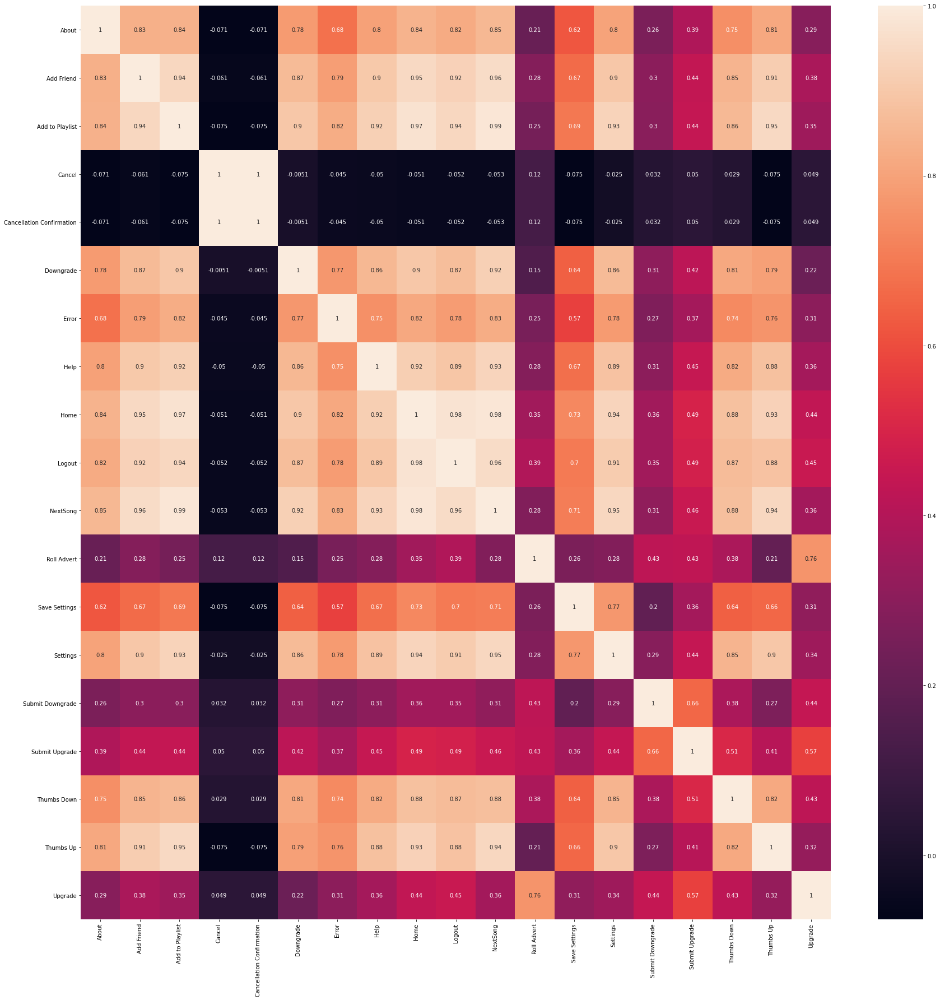

In [0]:
corrMatrix = pandasCorrelationData.corr()
plt.figure(figsize=(30, 30))
sn.heatmap(corrMatrix, annot=True)
plt.show()

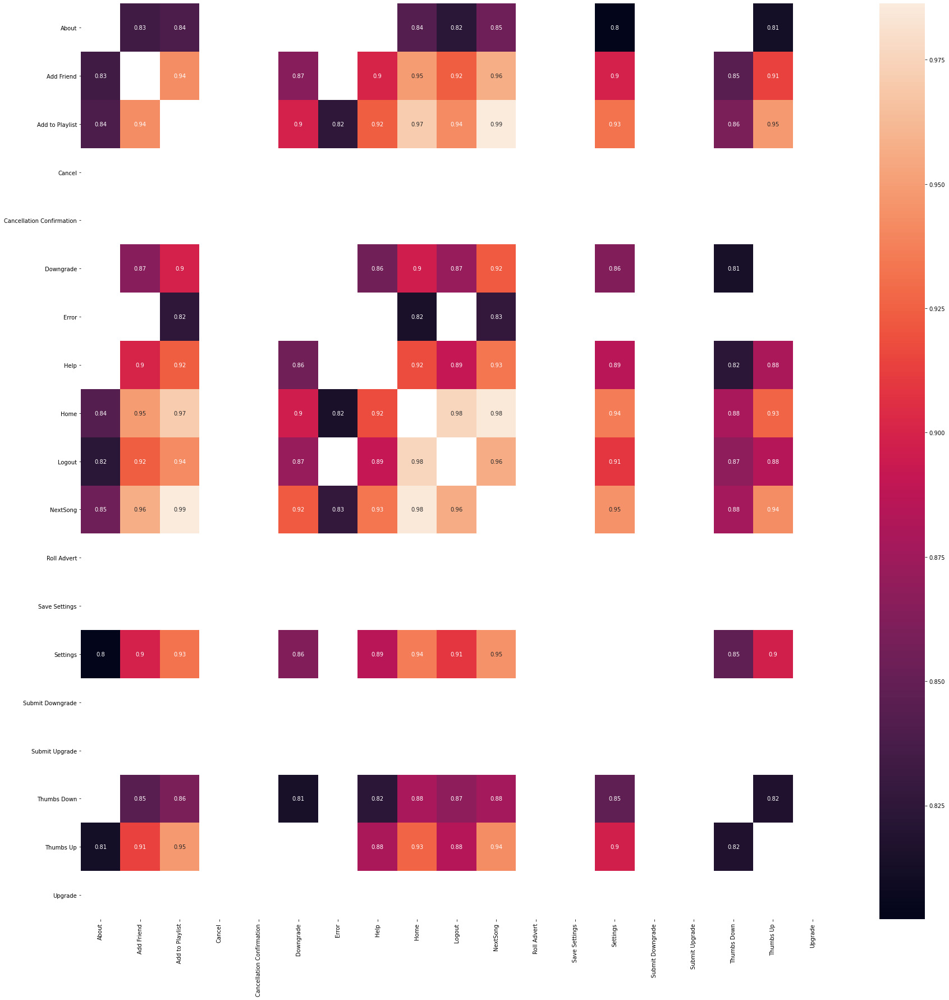

In [0]:
dfCorr = pandasCorrelationData.corr()
filteredDf = dfCorr[((dfCorr >= .8)) & (dfCorr !=1.000)]
plt.figure(figsize=(30,30))
sn.heatmap(filteredDf, annot=True)
plt.show()

In [0]:
corr_matrix = pandasCorrelationData.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] >= 0.8)]
print(to_drop)

['Add Friend', 'Add to Playlist', 'Cancellation Confirmation', 'Downgrade', 'Error', 'Help', 'Home', 'Logout', 'NextSong', 'Settings', 'Thumbs Down', 'Thumbs Up']


In [0]:
for col in to_drop:
  pageData=pageData.drop(col)

In [0]:
display(pageData)

userId,About,Cancel,Roll Advert,Save Settings,Submit Downgrade,Submit Upgrade,Upgrade
296,0,1,9,0,0,1,1
200002,1,1,11,0,0,1,2
100010,0,1,22,0,0,0,2
125,0,0,6,0,0,0,0
124,3,1,1,3,0,0,0
7,2,0,35,2,0,0,6
51,0,1,1,0,0,0,0
200037,1,1,9,0,0,0,0
169,0,0,13,1,0,0,2
205,3,0,0,2,0,0,0


####ChurnStatus
Será nuetra columna con la etiqueta de cada ejemplar, donde 1:Abandono, 0: No Abandono

In [0]:
riskUsers=work_df.select("userId").where("churnStatus=1").groupBy("userId").count().drop("count")
riskUsers=riskUsers.withColumn('CHURN', lit(1))
riskUsers.createOrReplaceTempView("riskUsers")

In [0]:
nonRiskUsers=spark.sql("select sparkifyView.userId from sparkifyView,riskUsers where  sparkifyView.userId not in (select riskUsers.userId from riskUsers) group by sparkifyView.userId ")
nonRiskUsers=nonRiskUsers.withColumn('CHURN', lit(0))

In [0]:
churnStatusData=nonRiskUsers.unionAll(riskUsers)

In [0]:
display(churnStatusData)

userId,CHURN
125,0
7,0
205,0
169,0
272,0
282,0
15,0
155,0
200043,0
300027,0


#Aplicación de algoritmo de ML (Decision Tree)

In [0]:
modelingData=genderData.join(levelData,['userId'])\
.join(avgListenData,['userId'])\
.join(locationData,['userId'])\
.join(churnStatusData,['userId'])
modelingData=modelingData.drop("userId")
#display(modelingData)
#.join(userAgentData,['userId'])\
#.join(pageData,['userId'])\
#.join(songCountData,['userId'])\

In [0]:
churnRiskUserSample= modelingData.select("*").where("CHURN=1")
nonChurnRiskUserSample=modelingData.select("*").where("CHURN=0")
nonChurnRiskUserSample=nonChurnRiskUserSample.sample((churnRiskUserSample.count()/nonChurnRiskUserSample.count()))
nonChurnRiskUserSample.count()
modelingData=nonChurnRiskUserSample.unionAll(churnRiskUserSample)
display(modelingData)

GEN,LV,AVG_LISTEN,Al_1,Al_2,Al_3,Al_4,Al_5,Al_6,An_7,Ap_8,At_9,At_10,At_11,Au_12,Au_13,Au_14,Ba_15,Ba_16,Be_17,Bi_18,Bi_19,Bi_20,Bo_21,Bo_22,Bo_23,Bo_24,Bo_25,Br_26,Br_27,Br_28,Bu_29,Ce_30,Ch_31,Ch_32,Ch_33,Ch_34,Ci_35,Cl_36,Co_37,Co_38,Co_39,Co_40,Co_41,Co_42,Cu_43,Da_44,Da_45,Da_46,Da_47,De_48,De_49,De_50,De_51,Du_52,Du_53,Du_54,El_55,El_56,Es_57,Fa_58,Fa_59,Fl_60,Fo_61,Fo_62,Fo_63,Fr_64,Ga_65,Ga_66,Gr_67,Gr_68,Gr_69,Ha_70,Ha_71,Ho_72,Ho_73,In_74,Io_75,Ja_76,Ja_77,Ja_78,Ja_79,Ka_80,Ka_81,Ki_82,Ki_83,Kl_84,Kn_85,La_86,La_87,La_88,La_89,La_90,La_91,Le_92,Le_93,Li_94,Lo_95,Lo_96,Lo_97,Lo_98,Ma_99,Ma_100,Ma_101,Ma_102,Mc_103,Me_104,Me_105,Mi_106,Mi_107,Mi_108,Mi_109,Mi_110,Mo_111,Mo_112,Mo_113,Mo_114,Mo_115,Mu_116,My_117,Na_118,Na_119,Ne_120,Ne_121,Ne_122,Ne_123,Ne_124,No_125,No_126,Ok_127,Om_128,Or_129,Os_130,Ot_131,Ox_132,Oz_133,Ph_134,Ph_135,Pi_136,Po_137,Po_138,Po_139,Pr_140,Pr_141,Pr_142,Qu_143,Ra_144,Ra_145,Ri_146,Ri_147,Ri_148,Ro_149,Ro_150,Ro_151,Ro_152,Ru_153,Sa_154,Sa_155,Sa_156,Sa_157,Sa_158,Sa_159,Sa_160,Sa_161,Se_162,Se_163,Sh_164,Si_165,Sp_166,St_167,St_168,St_169,Sy_170,Ta_171,Ta_172,To_173,To_174,Tr_175,Tr_176,Tu_177,Tu_178,Tu_179,Ty_180,Ur_181,Va_182,Ve_183,Vi_184,Vi_185,Wa_186,Wi_187,Wi_188,Wi_189,Wo_190,Yo_191,"York-Hanover, PA",CHURN
1,0,253.38441749999998,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,249.89166570469797,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,1,251.1158972347267,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,251.00864054215018,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,248.65622161458336,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,250.04138491484184,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,251.98598175895762,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [0]:
columns=modelingData.columns[:-1]
assembler = VectorAssembler(inputCols=columns, outputCol="features")
assembled = assembler.transform(modelingData)
#display(assembled)
treeModelData=assembled.select("CHURN","features")
#display(treeModelData)
minMax = MinMaxScaler().setInputCol("features").setOutputCol("Normalized_Features")
fittedminMax = minMax.fit(treeModelData)
normalizedTreeModelData=fittedminMax.transform(treeModelData)
normalizedTreeModelData=normalizedTreeModelData.drop("features")
#display(normalizedTreeModelData

In [0]:
churnIndexer = StringIndexer(inputCol="CHURN", outputCol="indexed_CHURN").fit(normalizedTreeModelData)
featureIndexer = VectorIndexer(inputCol="Normalized_Features", outputCol="indexed_Features", maxCategories=2).fit(normalizedTreeModelData)
(trainingData, testData) = normalizedTreeModelData.randomSplit([0.7, 0.3])
dt = DecisionTreeClassifier(labelCol="indexed_CHURN", featuresCol="indexed_Features")
pipeline = Pipeline(stages=[churnIndexer, featureIndexer, dt])
model = pipeline.fit(trainingData)
predictions = model.transform(testData)
#display(predictions.select("prediction", "indexed_CHURN", "Normalized_Features"))

In [0]:
evaluator = MulticlassClassificationEvaluator(labelCol="indexed_CHURN", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print("Accuracy = %g " % (accuracy))
evaluator = MulticlassClassificationEvaluator(labelCol="indexed_CHURN", predictionCol="prediction", metricName="recallByLabel")
recall = evaluator.evaluate(predictions)
print("Recall = %g " % (recall))

Accuracy = 0.554545 
Recall = 0.857143 


#Preguntas

In [0]:
df_preguntas=df.withColumn("R_date",from_unixtime(col('registration')/1000,'yyyy-MM-dd'))
df_preguntas=df_preguntas.withColumn("R_date",to_date(col("R_date"),"yyyy-MM-dd"))
df_preguntas=df_preguntas.withColumn("R_weekday",date_format(col("R_date"), "EEEE"))
df_preguntas=df_preguntas.withColumn("activity_date",from_unixtime(col('ts')/1000,'yyyy-MM-dd'))
df_preguntas=df_preguntas.withColumn("activity_date",to_date(col("activity_date"),"yyyy-MM-dd"))
df_preguntas=df_preguntas.withColumn("activity_weekday",date_format(col("activity_date"), "EEEE"))
df_preguntas=df_preguntas.withColumn("churnRisk",churnRiskFunction("page")) #creo una columna donde 0 es persona sin riesgo de abandonar y 1 es persona con riesgo de abandonar

In [0]:
df_preguntas.createOrReplaceTempView("sparkifyView")

In [0]:
%sql
CREATE OR REPLACE TEMPORARY VIEW riskUsers as 
select userId
from sparkifyView
where page="Cancellation Confirmation" or page = "Submit Downgrade"
group by userId;

In [0]:
%sql 
CREATE OR REPLACE TEMPORARY VIEW nonRiskUsers as 
select sparkifyView.userId
from sparkifyView,riskUsers
where  sparkifyView.userId not in (select riskUsers.userId from riskUsers)
group by sparkifyView.userId;

##1) ¿A qué horas del día se presenta mayor actividad de los usuarios en riesgo de abandono en comparación a los usuarios que nos están en riesgo de abandono?

Se logra observar que a las 10am hay mayor actividad de los usuarios en riesgo de abandono, mientras que los usuarios que no están en riesgo registran mayor actividad a las 6.

In [0]:
from pyspark.sql.functions import *
hours=spark.sql("select userId, timestamp(from_unixtime(ts,'yyyy-MM-dd HH:mm:ss')) as t from sparkifyView ")
hours=hours.withColumn("hour", hour(col("t")))
hours.createOrReplaceTempView("hoursDF")

In [0]:
%sql
with hoursRiskUsers(userId,hours)as
(select riskUsers.userId, hoursDF.hour
from riskUsers, hoursDF
where riskUsers.userId== hoursDF.userId),

groupedHoursRiskUsers(hours,count)as
(select hours, count(*)
from hoursRiskUsers
group by hours
),


hoursNonRiskUsers(userId,hours)as
(select nonRiskUsers.userId, hoursDF.hour
from nonRiskUsers, hoursDF
where nonRiskUsers.userId== hoursDF.userId),

groupedHoursNonRiskUsers(hours,count)as
(select hours, count(*)
from hoursNonRiskUsers
group by hours
)

select groupedHoursRiskUsers.hours, groupedHoursRiskUsers.count as riskCount, groupedHoursNonRiskUsers.count as nonRiskCount
from groupedHoursRiskUsers, groupedHoursNonRiskUsers
where groupedHoursNonRiskUsers.hours=groupedHoursRiskUsers.hours
order by groupedHoursRiskUsers.hours asc;

hours,riskCount,nonRiskCount
0,10577,11800
1,10870,11907
2,10772,11946
3,10722,11937
4,10675,11682
5,10839,11799
6,10721,12178
7,10855,12045
8,10714,12061
9,10791,11714


##2) ¿En qué  día(s) de la semana se presenta mayor actividad de los usuarios en riesgo de abandono en comparación a los usuarios que nos están en riesgo de abandono?

se puede observar que entre semana se registra mayor por parte de los usuarios que no están en riesgo de abandono, mientras que los están en riesgo presentan mayor actividad los fines de semana.

In [0]:
%sql
with weekdayRiskUser(userId,firstName,lastName,weekday)as
(select riskUsers.userId,sparkifyView.firstName,sparkifyView.lastName,sparkifyView.activity_weekday
from riskUsers, sparkifyView
where riskUsers.userId== sparkifyView.userId),

weekdayNonRiskUser(userId,firstName,lastName,weekday)as
(select nonRiskUsers.userId,sparkifyView.firstName,sparkifyView.lastName,sparkifyView.activity_weekday
from nonRiskUsers, sparkifyView
where nonRiskUsers.userId== sparkifyView.userId),


countRisk(weekday, count)as
(select weekday, count(*)
from weekdayRiskUser
group by weekday),


countNonRisk(weekday, count)as
(select weekday, count(*)
from weekdayNonRiskUser
group by weekday)


select countNonRisk.weekday, countNonRisk.count as nonRiskCount, countRisk.count as riskCount
from countNonRisk,countRisk
where countNonRisk.weekday=countRisk.weekday
ORDER BY 
     CASE
          WHEN countNonRisk.weekday = 'Monday' THEN 1
          WHEN countNonRisk.weekday = 'Tuesday' THEN 2
          WHEN countNonRisk.weekday = 'Wednesday' THEN 3
          WHEN countNonRisk.weekday = 'Thursday' THEN 4
          WHEN countNonRisk.weekday = 'Friday' THEN 5
          WHEN countNonRisk.weekday = 'Saturday' THEN 6
          WHEN countNonRisk.weekday = 'Sunday' THEN 7
     END ASC;



weekday,nonRiskCount,riskCount
Monday,44643,38418
Tuesday,46020,43750
Wednesday,48425,41525
Thursday,49988,42783
Friday,47470,43253
Saturday,28239,28718
Sunday,20278,20195


##3) ¿Para los usuarios que están en riesgo de abandono y los que no, qué tipo de nivel (pago, gratis) respresenta la mayoría en cada caso?

se obseva que hay más usuarios free tanto para los que están en riesgo de abandono que de los que no.

In [0]:
%sql
with levelRiskUser(userId,level)as
(select riskUsers.userId,sparkifyView.level
from riskUsers
inner join sparkifyView on riskUsers.userId=sparkifyView.userId
group by riskUsers.userId,sparkifyView.level
),

groupedlevelRiskUser(level,count)as
(select level,count(*)
from levelRiskUser
group by level),

levelNonRiskUser(userId,level)as
(select nonRiskUsers.userId,sparkifyView.level
from nonRiskUsers, sparkifyView
where nonRiskUsers.userId= sparkifyView.userId
group by nonRiskUsers.userId,sparkifyView.level
),

groupedlevelNonRiskUser(level,count)as
(select level,count(*)
from levelNonRiskUser
group by level)


select groupedlevelRiskUser.level, groupedlevelRiskUser.count as riskCount, groupedlevelNonRiskUser.count as nonRiskCount
from groupedlevelRiskUser,groupedlevelNonRiskUser
where groupedlevelRiskUser.level=groupedlevelNonRiskUser.level;

level,riskCount,nonRiskCount
free,158,213
paid,151,171


##4) ¿Respecto a los eventos de "Agregar un amigo", "publicidad", "pulgar hacia arriba", qué tipo de usuario(En riesgo de abandono y no) presenta mayor actividad?

tanto el evento agregar amigo como pulgar arriba registra mayor actividad por parte de los usuarios que no están en riesgo de abandono, mientras que hay mayor publicidad para los que están en riesgo de abandono, lo cual podría ser una señal de una de las razones por las que abandonan.

In [0]:
%sql
with pageCountByRiskUsers(userId,firstName,lastName,page)as
(select riskUsers.userId,sparkifyView.firstName,sparkifyView.lastName,page
from riskUsers, sparkifyView
where riskUsers.userId== sparkifyView.userId),

pageCountByNonRiskUsers(userId,firstName,lastName,page)as
(select nonRiskUsers.userId,sparkifyView.firstName,sparkifyView.lastName,page
from nonRiskUsers, sparkifyView
where nonRiskUsers.userId== sparkifyView.userId),

countNonRisk(page, count)as
(select page, count(*)
from pageCountByNonRiskUsers
group by page),

countRisk(page, count)as
(select page, count(*)
from pageCountByRiskUsers
group by page),

pages(page)as
(select page
from sparkifyView
group by page),

countResult(page , nonRiskCount, riskCount) as
(select countRisk.page, countNonRisk.count as nonRiskCount, countRisk.count as riskCount
from countRisk
left join countNonRisk on countNonRisk.page=countRisk.page)

select page , nonRiskCount, riskCount
from countResult;

page,nonRiskCount,riskCount
Cancel,null,99
Submit Downgrade,null,117
Thumbs Down,2422,2489
Home,17977,9435
Downgrade,1831,1980
Roll Advert,3378,4395
Logout,3063,2927
Save Settings,318,267
Cancellation Confirmation,null,99
About,1365,490


##5) ¿Cuáles son los dispositivos más usados por los usuarios en riesgo de abandono y de los que no ?

el dispositivo más usado por los usuarios que no están en riesgo de abandono en un Windows con Chrome, mientras que los que están en riesgo de abandono usan Windows con FireFox.

In [0]:
%sql
with userAgentRiskUser(userId,userAgent)as
(select riskUsers.userId,sparkifyView.userAgent
from riskUsers, sparkifyView
where riskUsers.userId=sparkifyView.userId
group by riskUsers.userId,sparkifyView.userAgent
),

groupedUserAgentRiskUser(userAgent,count)as
(select userAgent,count(*)
from userAgentRiskUser
group by userAgent),


userAgentNonRiskUser(userId,userAgent)as
(select nonRiskUsers.userId,sparkifyView.userAgent
from nonRiskUsers, sparkifyView
where nonRiskUsers.userId=sparkifyView.userId
group by nonRiskUsers.userId,sparkifyView.userAgent
),

groupedUserAgentNonRiskUser(userAgent,count)as
(select userAgent,count(*)
from userAgentNonRiskUser
group by userAgent)

select groupedUserAgentRiskUser.userAgent, groupedUserAgentRiskUser.count as riskCount, groupedUserAgentNonRiskUser.count as nonRiskCount
from groupedUserAgentRiskUser,groupedUserAgentNonRiskUser
where groupedUserAgentRiskUser.userAgent=groupedUserAgentNonRiskUser.userAgent;

userAgent,riskCount,nonRiskCount
"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_8_5) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",1,2
"""Mozilla/5.0 (Windows NT 5.1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",1,5
"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.125 Safari/537.36""",14,16
"""Mozilla/5.0 (Macintosh; Intel Mac OS X 10_9_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/35.0.1916.153 Safari/537.36""",2,1
Mozilla/5.0 (Macintosh; Intel Mac OS X 10.7; rv:31.0) Gecko/20100101 Firefox/31.0,1,1
Mozilla/5.0 (Windows NT 6.1; WOW64; rv:30.0) Gecko/20100101 Firefox/30.0,3,1
Mozilla/5.0 (Windows NT 6.3; WOW64; rv:31.0) Gecko/20100101 Firefox/31.0,3,8
Mozilla/5.0 (compatible; MSIE 9.0; Windows NT 6.1; WOW64; Trident/5.0),2,4
"""Mozilla/5.0 (Windows NT 6.3; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1985.143 Safari/537.36""",5,7
Mozilla/5.0 (Macintosh; Intel Mac OS X 10.9; rv:31.0) Gecko/20100101 Firefox/31.0,6,11


##6) ¿De qué ciudad proviene la mayor cantidad de usuarios en riesgo de abandono y de los que no ?

la mayoria de usuarios en riesgo de abandono provienen de Los Angeles, mientras que los que no están en riesgo de abandono, la mayoría proviene de Nueva York

In [0]:
%sql
with locationRiskUser(userId,loc)as
(select riskUsers.userId,sparkifyView.location
from riskUsers, sparkifyView
where riskUsers.userId=sparkifyView.userId
group by riskUsers.userId,sparkifyView.location
),

groupedLocationRiskUser(loc,count)as
(select loc,count(*)
from locationRiskUser
group by loc),


locationNonRiskUser(userId,loc)as
(select nonRiskUsers.userId,sparkifyView.location
from nonRiskUsers, sparkifyView
where nonRiskUsers.userId=sparkifyView.userId
group by nonRiskUsers.userId,sparkifyView.location
),

groupedLocationNonRiskUser(loc,count)as
(select loc,count(*)
from locationNonRiskUser
group by loc)

select groupedLocationRiskUser.loc, groupedLocationRiskUser.count as riskCount, groupedLocationNonRiskUser.count as nonRiskCount
from groupedLocationRiskUser,groupedLocationNonRiskUser
where groupedLocationRiskUser.loc=groupedLocationNonRiskUser.loc;

loc,riskCount,nonRiskCount
"Deltona-Daytona Beach-Ormond Beach, FL",1,1
"New Haven-Milford, CT",1,2
"Corpus Christi, TX",1,2
"Indianapolis-Carmel-Anderson, IN",1,3
"Seattle-Tacoma-Bellevue, WA",2,5
"Los Angeles-Long Beach-Anaheim, CA",16,14
"Minneapolis-St. Paul-Bloomington, MN-WI",1,5
"San Francisco-Oakland-Hayward, CA",4,6
"Lafayette-West Lafayette, IN",1,1
"Phoenix-Mesa-Scottsdale, AZ",2,6


##7) ¿De media cuánto dura un cliente en riesgo de abandono de abandonar el servicio desde que cambia de nivel de pago a free?

De media, un usuario abandona el servicio 28 días después de cambiar de nivel de pago a free.

In [0]:
%sql

CREATE OR REPLACE TEMPORARY VIEW riskT as 

with riskPeriodRiskUser(userId,page)as
(select riskUsers.userId,sparkifyView.page
from riskUsers, sparkifyView
where riskUsers.userId=sparkifyView.userId
group by riskUsers.userId,sparkifyView.page
),


CancellationConfirmationRiskUser(userId)as
(select userId
from riskPeriodRiskUser
where page="Cancellation Confirmation" 
group by userId),

SubmitDowngradeRiskUser(userId)as
(select userId
from riskPeriodRiskUser
where page="Submit Downgrade"
group by userId),


riskPeriodUsers(userId)as
(select CancellationConfirmationRiskUser.userId
from CancellationConfirmationRiskUser
inner join SubmitDowngradeRiskUser on CancellationConfirmationRiskUser.userId=SubmitDowngradeRiskUser.userId),

SubmitDowngradeRiskUserTime(userId,page,activity_date)as
(select riskPeriodUsers.userId,sparkifyView.page,sparkifyView.activity_date
from riskPeriodUsers, sparkifyView
where riskPeriodUsers.userId=sparkifyView.userId and sparkifyView.page="Submit Downgrade"),

CancellationConfirmationTime(userId,page,activity_date)as
(select riskPeriodUsers.userId,sparkifyView.page,sparkifyView.activity_date
from riskPeriodUsers, sparkifyView
where riskPeriodUsers.userId=sparkifyView.userId and sparkifyView.page="Cancellation Confirmation"),

riskTime(userId,SubmitDowngradeDate,CancellationConfirmationTimeDate,TimePassed ) as
(select SubmitDowngradeRiskUserTime.userId, SubmitDowngradeRiskUserTime.activity_date as SubmitDowngradeDate, CancellationConfirmationTime.activity_date as CancellationConfirmationTimeDate, DATEDIFF(CancellationConfirmationTime.activity_date,SubmitDowngradeRiskUserTime.activity_date) as  TimePassed
from SubmitDowngradeRiskUserTime
inner join CancellationConfirmationTime on SubmitDowngradeRiskUserTime.userId=CancellationConfirmationTime.userId),

riskTimeResult(userId,TimePassedInDays)as
(select userId,TimePassed as TimePassedInDays
from riskTime)

select userId, sum(TimePassedInDays) as TimePassedInDays
from riskTimeResult
group by userId;

In [0]:
%sql
select *
from riskT;

userId,TimePassedInDays
100011,22
100024,33
100025,1
100042,24
100043,59
100047,6
118,18
140,15
18,43
200020,52


In [0]:
%sql 
select avg(TimePassedInDays)
from riskT;

avg(TimePassedInDays)
28.80952380952381


##8) ¿Qué variables influyen más en el entrenamiento del modelo?

La pagina que visitan, el número medio de minutos que escuchan de música, el género, el nivel y el dispositivo que usan.